# 05B. Lost / Found End-to-End Visual Search Optimized — `proyecto_integrador_v2`

Este notebook corresponde al **Paso 05B optimizado** del pipeline `proyecto_integrador_v2`.

## Objetivo

Probar el pipeline completo con imágenes nuevas de perros perdidos o encontrados.

El flujo end-to-end será:

```text
1. Imagen nueva
2. YOLO detecta perro
3. Se genera crop
4. EfficientNetB0 extrae embedding visual
5. Se normaliza con L2
6. Se compara contra la base de embeddings del Paso 03
7. Se recuperan vecinos Top-K por similitud coseno
8. Se asigna decisión: match fuerte, posible match, débil o sin match claro
```

En este paso, la salida principal no es la raza.  
La salida principal son **posibles coincidencias visuales** contra la base.

## Carpeta de entrada

Coloca imágenes nuevas en:

```text
/content/drive/MyDrive/proyecto_integrador_v2/raw_data/team_test
```

También puedes usar subcarpetas, por ejemplo:

```text
raw_data/team_test/lost/
raw_data/team_test/found/
```

El notebook buscará imágenes en toda la carpeta `team_test`.

## Archivos necesarios de pasos anteriores

Este notebook requiere:

```text
processed_data/embeddings/step03b_optimized_dog_embeddings_l2.npy
processed_data/metadata/step03b_optimized_embeddings_metadata.csv
```

Estos archivos representan la base visual contra la cual se compararán las imágenes nuevas.

## Diferencia contra el Paso 05 original

Esta versión **05B optimizada** usa la configuración ganadora de detección/crop y la base vectorial optimizada:

```python
CONF_THRESHOLD = 0.15
CROP_MARGIN = 0.35
```

Entradas optimizadas:

```text
processed_data/embeddings/step03b_optimized_dog_embeddings_l2.npy
processed_data/metadata/step03b_optimized_embeddings_metadata.csv
```

Outputs separados:

```text
processed_data/step05b_end_to_end_search_optimized/
reports/tables/step05b_optimized_...
reports/figures/step05b_optimized_...
```

Esto evita sobrescribir el Paso 05 original y permite comparar el pipeline base contra el pipeline optimizado.

In [1]:
# 0. Instalación de dependencias

!pip install -q ultralytics tensorflow opencv-python pillow pandas numpy matplotlib tqdm scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 17.4 MB/s eta 0:00:00


In [2]:
# 1. Imports y configuración general

from pathlib import Path
import json
import time
import math
from datetime import datetime

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image, ImageOps
from tqdm import tqdm

from ultralytics import YOLO

import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.applications.efficientnet import preprocess_input as efficientnet_preprocess
from tensorflow.keras.models import Model

from sklearn.preprocessing import normalize

pd.set_option("display.max_columns", 200)

SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("TensorFlow:", tf.__version__)
print("GPU disponible:", tf.config.list_physical_devices("GPU"))

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
TensorFlow: 2.20.0
GPU disponible: []


In [3]:
# 2. Montar Google Drive

from google.colab import drive

if Path("/content/drive/MyDrive").exists():
    print("Google Drive ya está montado.")
else:
    drive.mount("/content/drive")

Mounted at /content/drive


In [4]:
# 3. Rutas del proyecto

PROJECT_ROOT = Path("/content/drive/MyDrive/proyecto_integrador_v2")
CONFIG_PATH = PROJECT_ROOT / "project_config.json"

if CONFIG_PATH.exists():
    with open(CONFIG_PATH, "r", encoding="utf-8") as f:
        config = json.load(f)
else:
    config = {}

RAW_DATA_PATH = PROJECT_ROOT / "raw_data"
TEAM_TEST_PATH = RAW_DATA_PATH / "team_test"

PROCESSED_DATA_PATH = PROJECT_ROOT / "processed_data"
EMBEDDINGS_PATH = PROCESSED_DATA_PATH / "embeddings"
METADATA_PATH = PROCESSED_DATA_PATH / "metadata"
SEARCH_RESULTS_PATH = PROCESSED_DATA_PATH / "search_results"

STEP05_PATH = PROCESSED_DATA_PATH / "step05b_end_to_end_search_optimized"
STEP05_CROPS_PATH = STEP05_PATH / "query_crops"
STEP05_RESULTS_PATH = STEP05_PATH / "results"

REPORTS_PATH = PROJECT_ROOT / "reports"
FIGURES_PATH = REPORTS_PATH / "figures"
TABLES_PATH = REPORTS_PATH / "tables"

MODELS_PATH = PROJECT_ROOT / "models"
YOLO_MODELS_PATH = MODELS_PATH / "yolo"
EMBEDDING_MODELS_PATH = MODELS_PATH / "embedding_model"

for p in [
    TEAM_TEST_PATH,
    STEP05_PATH,
    STEP05_CROPS_PATH,
    STEP05_RESULTS_PATH,
    REPORTS_PATH,
    FIGURES_PATH,
    TABLES_PATH,
    YOLO_MODELS_PATH,
    EMBEDDING_MODELS_PATH
]:
    p.mkdir(parents=True, exist_ok=True)

EMBEDDINGS_L2_PATH = EMBEDDINGS_PATH / "step03b_optimized_dog_embeddings_l2.npy"
EMBEDDINGS_METADATA_PATH = METADATA_PATH / "step03b_optimized_embeddings_metadata.csv"

TARGET_SIZE = int(config.get("image_size", 224))

detector_config = config.get("detector", {})
YOLO_MODEL_NAME = detector_config.get("default_model", "yolo26s.pt")
FALLBACK_YOLO_MODEL_NAME = detector_config.get("fallback_model", "yolo11s.pt")
CONF_THRESHOLD = 0.15
CROP_MARGIN = 0.35

TOP_K = 10
VISUAL_TOP_K = 5

SEARCH_VARIANT = "optimized_02b_03b_04b_efficientnetb0"

print("PROJECT_ROOT:", PROJECT_ROOT)
print("TEAM_TEST_PATH:", TEAM_TEST_PATH)
print("EMBEDDINGS_L2_PATH:", EMBEDDINGS_L2_PATH)
print("EMBEDDINGS_METADATA_PATH:", EMBEDDINGS_METADATA_PATH)
print("TARGET_SIZE:", TARGET_SIZE)
print("YOLO_MODEL_NAME:", YOLO_MODEL_NAME)
print("CONF_THRESHOLD:", CONF_THRESHOLD)
print("CROP_MARGIN:", CROP_MARGIN)
print("SEARCH_VARIANT:", SEARCH_VARIANT)

PROJECT_ROOT: /content/drive/MyDrive/proyecto_integrador_v2
TEAM_TEST_PATH: /content/drive/MyDrive/proyecto_integrador_v2/raw_data/team_test
EMBEDDINGS_L2_PATH: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/embeddings/step03b_optimized_dog_embeddings_l2.npy
EMBEDDINGS_METADATA_PATH: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/metadata/step03b_optimized_embeddings_metadata.csv
TARGET_SIZE: 224
YOLO_MODEL_NAME: yolo26s.pt
CONF_THRESHOLD: 0.15
CROP_MARGIN: 0.35
SEARCH_VARIANT: optimized_02b_03b_04b_efficientnetb0


In [5]:
# 4. Cargar base de embeddings del Paso 03

if not EMBEDDINGS_L2_PATH.exists():
    raise FileNotFoundError(
        f"No se encontró {EMBEDDINGS_L2_PATH}. Ejecuta primero el Paso 03."
    )

if not EMBEDDINGS_METADATA_PATH.exists():
    raise FileNotFoundError(
        f"No se encontró {EMBEDDINGS_METADATA_PATH}. Ejecuta primero el Paso 03."
    )

database_embeddings_l2 = np.load(EMBEDDINGS_L2_PATH)
database_metadata_df = pd.read_csv(EMBEDDINGS_METADATA_PATH).reset_index(drop=True)

if len(database_metadata_df) != database_embeddings_l2.shape[0]:
    print("Advertencia: metadata y embeddings tienen tamaños diferentes.")
    min_len = min(len(database_metadata_df), database_embeddings_l2.shape[0])
    database_metadata_df = database_metadata_df.head(min_len).copy()
    database_embeddings_l2 = database_embeddings_l2[:min_len]

print("Base embeddings:", database_embeddings_l2.shape)
print("Metadata:", database_metadata_df.shape)

display(database_metadata_df.head())

Base embeddings: (19568, 1280)
Metadata: (19568, 50)


,image_path,relative_path,source_type,dog_id,report_id,filename,extension,read_status,read_error,curated_image_path,model_ready_image_path,width,height,aspect_ratio,brightness_mean,contrast_std,sharpness_laplacian_var,saturation_mean,colorfulness,edge_density,quality_label,quality_flags,detection_input_path,original_detection_input_path,pipeline_step,selected_yolo_model,conf_threshold,crop_margin,dog_detected,num_dog_detections,best_confidence,best_area,best_x1,best_y1,best_x2,best_y2,crop_status,crop_error,crop_path,crop_width,crop_height,needs_review_detection,detection_review_reason,crop_x1,crop_y1,crop_x2,crop_y2,original_crop_path,embedding_status,embedding_error
0,/content/drive/MyDrive/proyecto_integrador_v2/...,images/n02085620-Chihuahua/n02085620_10074.jpg,base_images,NaN,NaN,n02085620_10074.jpg,.jpg,ok,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,333,500,0.666000,80.933724,67.169699,782.019819,70.510204,26.020002,0.086222,good,none,/content/proyecto_integrador_v2/images_curated...,/content/drive/MyDrive/proyecto_integrador_v2/...,02B_optimized,yolo26s.pt,0.15,0.35,True,1,0.911131,116640.0,31.0,18.0,274.0,498.0,ok,NaN,/content/proyecto_integrador_v2/dog_crops_opti...,333.0,500.0,False,none,0.0,0.0,333.0,500.0,/content/drive/MyDrive/proyecto_integrador_v2/...,ok,NaN
1,/content/drive/MyDrive/proyecto_integrador_v2/...,images/n02085620-Chihuahua/n02085620_10131.jpg,base_images,NaN,NaN,n02085620_10131.jpg,.jpg,ok,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,395,495,0.797980,57.823199,65.480311,361.080245,153.008863,50.975990,0.117330,good,none,/content/proyecto_integrador_v2/images_curated...,/content/drive/MyDrive/proyecto_integrador_v2/...,02B_optimized,yolo26s.pt,0.15,0.35,True,1,0.877236,165808.0,50.0,9.0,394.0,491.0,ok,NaN,/content/proyecto_integrador_v2/dog_crops_opti...,395.0,495.0,False,none,0.0,0.0,395.0,495.0,/content/drive/MyDrive/proyecto_integrador_v2/...,ok,NaN
2,/content/drive/MyDrive/proyecto_integrador_v2/...,images/n02085620-Chihuahua/n02085620_10621.jpg,base_images,NaN,NaN,n02085620_10621.jpg,.jpg,ok,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,500,298,1.677852,140.799376,39.013514,99.042644,45.400081,24.762783,0.027584,acceptable,low_sharpness,/content/proyecto_integrador_v2/images_curated...,/content/drive/MyDrive/proyecto_integrador_v2/...,02B_optimized,yolo26s.pt,0.15,0.35,True,1,0.956422,38178.0,145.0,46.0,334.0,248.0,ok,NaN,/content/proyecto_integrador_v2/dog_crops_opti...,321.0,298.0,False,none,79.0,0.0,400.0,298.0,/content/drive/MyDrive/proyecto_integrador_v2/...,ok,NaN
3,/content/drive/MyDrive/proyecto_integrador_v2/...,images/n02085620-Chihuahua/n02085620_1073.jpg,base_images,NaN,NaN,n02085620_1073.jpg,.jpg,ok,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,345,500,0.690000,113.087635,77.667901,1297.671480,76.206643,24.119247,0.137217,good,none,/content/proyecto_integrador_v2/images_curated...,/content/drive/MyDrive/proyecto_integrador_v2/...,02B_optimized,yolo26s.pt,0.15,0.35,True,1,0.926782,146328.0,0.0,29.0,312.0,498.0,ok,NaN,/content/proyecto_integrador_v2/dog_crops_opti...,345.0,500.0,False,none,0.0,0.0,345.0,500.0,/content/drive/MyDrive/proyecto_integrador_v2/...,ok,NaN
4,/content/drive/MyDrive/proyecto_integrador_v2/...,images/n02085620-Chihuahua/n02085620_10976.jpg,base_images,NaN,NaN,n02085620_10976.jpg,.jpg,ok,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,/content/drive/MyDrive/proyecto_integrador_v2/...,322,484,0.665289,121.949656,38.751610,277.332779,118.489746,35.805992,0.048387,good,none,/content/proyecto_integrador_v2/images_curated...,/content/drive/MyDrive/proyecto_integrador_v2/...,02B_optimized,yolo26s.pt,0.15,0.35,True,1,0.953500,53851.0,91.0,105.0,248.0,448.0,ok,NaN,/content/proyecto_integrador_v2/dog_crops_opti...,265.0,484.0,False,non

In [6]:
# 5. Validar normalización de base

norms = np.linalg.norm(database_embeddings_l2, axis=1)

print("Norma mínima:", norms.min())
print("Norma máxima:", norms.max())
print("Norma promedio:", norms.mean())

if np.allclose(norms.mean(), 1.0, atol=1e-3):
    print("OK: base normalizada con L2.")
else:
    print("Advertencia: revisar normalización.")

Norma mínima: 0.9999997
Norma máxima: 1.0000002
Norma promedio: 1.0
OK: base normalizada con L2.


In [7]:
# 6. Cargar imágenes nuevas de team_test

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".bmp", ".webp"}

team_images = [
    p for p in sorted(TEAM_TEST_PATH.rglob("*"))
    if p.is_file() and p.suffix.lower() in IMAGE_EXTENSIONS
]

team_test_df = pd.DataFrame({
    "query_image_path": [str(p) for p in team_images],
    "query_filename": [p.name for p in team_images],
    "query_relative_path": [str(p.relative_to(TEAM_TEST_PATH)) for p in team_images]
})

print("Imágenes encontradas en team_test:", len(team_test_df))

if len(team_test_df) == 0:
    print("Coloca imágenes en:", TEAM_TEST_PATH)

display(team_test_df.head())

Imágenes encontradas en team_test: 8


,query_image_path,query_filename,query_relative_path
0,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,11_1 (4).jpg
1,/content/drive/MyDrive/proyecto_integrador_v2/...,15_1.jpg,15_1.jpg
2,/content/drive/MyDrive/proyecto_integrador_v2/...,1_1 (2).jpg,1_1 (2).jpg
3,/content/drive/MyDrive/proyecto_integrador_v2/...,2_1.jpg,2_1.jpg
4,/content/drive/MyDrive/proyecto_integrador_v2/...,8_1.jpg,8_1.jpg


In [8]:
# 7. Cargar detector YOLO

def load_yolo_detector(primary_model: str, fallback_model: str):
    try:
        print(f"Intentando cargar detector principal: {primary_model}")
        model = YOLO(primary_model)
        selected_model = primary_model
    except Exception as e:
        print("No se pudo cargar el detector principal.")
        print("Error:", e)
        print(f"Usando detector fallback: {fallback_model}")
        model = YOLO(fallback_model)
        selected_model = fallback_model

    return model, selected_model


yolo_detector, selected_yolo_model = load_yolo_detector(
    YOLO_MODEL_NAME,
    FALLBACK_YOLO_MODEL_NAME
)

dog_class_id = None

for class_id, class_name in yolo_detector.names.items():
    if str(class_name).lower() == "dog":
        dog_class_id = int(class_id)
        break

if dog_class_id is None:
    raise ValueError("No se encontró la clase 'dog' en el modelo YOLO seleccionado.")

print("Modelo YOLO seleccionado:", selected_yolo_model)
print("ID clase dog:", dog_class_id)

Intentando cargar detector principal: yolo26s.pt
Modelo YOLO seleccionado: yolo26s.pt
ID clase dog: 16


In [9]:
# 8. Crear extractor de embeddings EfficientNetB0

base_model = EfficientNetB0(
    weights="imagenet",
    include_top=False,
    pooling="avg",
    input_shape=(TARGET_SIZE, TARGET_SIZE, 3)
)

embedding_model = Model(
    inputs=base_model.input,
    outputs=base_model.output
)

EMBEDDING_MODEL_NAME = "EfficientNetB0_ImageNet_pooling_avg"
EMBEDDING_DIM = int(embedding_model.output_shape[-1])

print("Modelo de embeddings:", EMBEDDING_MODEL_NAME)
print("Dimensión query embedding:", EMBEDDING_DIM)
print("Dimensión base embeddings:", database_embeddings_l2.shape[1])

if EMBEDDING_DIM != database_embeddings_l2.shape[1]:
    raise ValueError(
        f"Dimensión incompatible: query={EMBEDDING_DIM}, base={database_embeddings_l2.shape[1]}"
    )

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Modelo de embeddings: EfficientNetB0_ImageNet_pooling_avg
Dimensión query embedding: 1280
Dimensión base embeddings: 1280


In [10]:
# 9. Funciones end-to-end

def read_image_rgb(image_path):
    """Lee una imagen, corrige EXIF y regresa RGB."""
    img = Image.open(image_path)
    img = ImageOps.exif_transpose(img)
    img = img.convert("RGB")
    return np.array(img)


def detect_dogs_yolo(image_path, model, dog_class_id, conf_threshold=0.25):
    """Detecta perros en una imagen usando YOLO."""
    results = model(str(image_path), conf=conf_threshold, verbose=False)

    detections = []

    for result in results:
        boxes = result.boxes

        if boxes is None:
            continue

        for box in boxes:
            class_id = int(box.cls[0])
            confidence = float(box.conf[0])

            if class_id == dog_class_id:
                x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)

                w = max(0, x2 - x1)
                h = max(0, y2 - y1)
                area = int(w * h)

                detections.append({
                    "class_id": class_id,
                    "class_name": "dog",
                    "confidence": confidence,
                    "x1": int(x1),
                    "y1": int(y1),
                    "x2": int(x2),
                    "y2": int(y2),
                    "box_width": int(w),
                    "box_height": int(h),
                    "area": area
                })

    return detections


def select_best_detection(detections):
    """Selecciona la detección principal usando área y confianza."""
    if len(detections) == 0:
        return None

    return sorted(
        detections,
        key=lambda d: (d["area"], d["confidence"]),
        reverse=True
    )[0]


def crop_detection(image_path, detection, output_path, margin=0.15):
    """Genera crop con margen alrededor de la detección."""
    image_bgr = cv2.imread(str(image_path))

    if image_bgr is None:
        return None, "image_not_readable"

    img_h, img_w = image_bgr.shape[:2]

    x1, y1, x2, y2 = detection["x1"], detection["y1"], detection["x2"], detection["y2"]

    box_w = x2 - x1
    box_h = y2 - y1

    mx = int(box_w * margin)
    my = int(box_h * margin)

    x1m = max(0, x1 - mx)
    y1m = max(0, y1 - my)
    x2m = min(img_w, x2 + mx)
    y2m = min(img_h, y2 + my)

    if x2m <= x1m or y2m <= y1m:
        return None, "invalid_crop_coordinates"

    crop = image_bgr[y1m:y2m, x1m:x2m]

    output_path.parent.mkdir(parents=True, exist_ok=True)

    ok = cv2.imwrite(str(output_path), crop)

    if not ok:
        return None, "crop_write_failed"

    crop_h, crop_w = crop.shape[:2]

    crop_info = {
        "query_crop_path": str(output_path),
        "query_crop_width": int(crop_w),
        "query_crop_height": int(crop_h),
        "query_crop_x1": int(x1m),
        "query_crop_y1": int(y1m),
        "query_crop_x2": int(x2m),
        "query_crop_y2": int(y2m)
    }

    return crop_info, None


def preprocess_crop_for_embedding(crop_path, target_size=224):
    """Carga un crop y aplica preprocessing de EfficientNet."""
    img = Image.open(crop_path).convert("RGB")
    img = img.resize((target_size, target_size))
    arr = np.array(img).astype(np.float32)
    arr = np.expand_dims(arr, axis=0)
    arr = efficientnet_preprocess(arr)
    return arr


def extract_query_embedding_l2(crop_path, embedding_model):
    """Extrae embedding y normaliza L2."""
    arr = preprocess_crop_for_embedding(crop_path, target_size=TARGET_SIZE)
    emb = embedding_model.predict(arr, verbose=0)
    emb_l2 = normalize(emb, norm="l2")
    return emb[0], emb_l2[0]


def search_topk(query_embedding_l2, database_embeddings_l2, database_metadata_df, top_k=10):
    """Busca Top-K vecinos por similitud coseno."""
    sims = np.dot(query_embedding_l2.reshape(1, -1), database_embeddings_l2.T)[0]

    candidate_indices = np.argpartition(sims, -top_k)[-top_k:]
    top_indices = candidate_indices[np.argsort(sims[candidate_indices])[::-1]]

    rows = []

    for rank, idx in enumerate(top_indices, start=1):
        meta = database_metadata_df.iloc[int(idx)]

        rows.append({
            "neighbor_rank": int(rank),
            "neighbor_index": int(idx),
            "cosine_similarity": float(sims[idx]),
            "neighbor_crop_path": meta.get("crop_path", None),
            "neighbor_original_crop_path": meta.get("original_crop_path", None),
            "neighbor_source_type": meta.get("source_type", None),
            "neighbor_quality_label": meta.get("quality_label", None),
            "neighbor_dog_id": meta.get("dog_id", None),
            "neighbor_report_id": meta.get("report_id", None),
        })

    return pd.DataFrame(rows)


def assign_match_decision(top1_similarity, top5_avg_similarity=None):
    """Asigna decisión inicial basada en similitud visual.

    Estos umbrales son heurísticos y deben calibrarse con identity_test.
    """
    if pd.isna(top1_similarity):
        return "needs_review_no_similarity"

    if top1_similarity >= 0.90:
        return "high_confidence_visual_match"

    if top1_similarity >= 0.80:
        return "possible_visual_match"

    if top1_similarity >= 0.70:
        return "weak_visual_match_needs_review"

    return "no_strong_visual_match"

## Decisión visual

Los umbrales iniciales son heurísticos:

```text
Top-1 >= 0.90 → high_confidence_visual_match
0.80 - 0.90  → possible_visual_match
0.70 - 0.80  → weak_visual_match_needs_review
< 0.70       → no_strong_visual_match
```

Estos umbrales deberán calibrarse en el Paso 06 con imágenes del mismo perro tomadas desde distintos ángulos.

In [11]:
# 10. Ejecutar pipeline end-to-end sobre team_test


query_records = []
neighbor_records = []
embedding_records = []

start = time.time()

for _, row in tqdm(team_test_df.iterrows(), total=len(team_test_df)):
    query_image_path = Path(row["query_image_path"])
    query_filename = row["query_filename"]
    query_relative_path = row["query_relative_path"]

    base_record = {
        "query_image_path": str(query_image_path),
        "query_filename": query_filename,
        "query_relative_path": query_relative_path,
        "selected_yolo_model": selected_yolo_model,
        "conf_threshold": CONF_THRESHOLD,
        "crop_margin": CROP_MARGIN,
        "dog_detected": False,
        "num_dog_detections": 0,
        "best_yolo_confidence": np.nan,
        "query_crop_path": None,
        "query_crop_width": np.nan,
        "query_crop_height": np.nan,
        "embedding_generated": False,
        "top1_similarity": np.nan,
        "top5_avg_similarity": np.nan,
        "final_decision": "not_processed",
        "status": "not_processed",
        "error": None
    }

    try:
        detections = detect_dogs_yolo(
            query_image_path,
            yolo_detector,
            dog_class_id,
            conf_threshold=CONF_THRESHOLD
        )

        base_record["num_dog_detections"] = len(detections)

        best_detection = select_best_detection(detections)

        if best_detection is None:
            base_record["status"] = "needs_review_no_dog_detected"
            base_record["final_decision"] = "needs_review_no_dog_detected"
            query_records.append(base_record)
            continue

        base_record["dog_detected"] = True
        base_record["best_yolo_confidence"] = best_detection["confidence"]

        crop_output_path = STEP05_CROPS_PATH / Path(query_relative_path).with_suffix(".jpg")

        crop_info, crop_error = crop_detection(
            query_image_path,
            best_detection,
            crop_output_path,
            margin=CROP_MARGIN
        )

        if crop_error is not None:
            base_record["status"] = "crop_error"
            base_record["error"] = crop_error
            base_record["final_decision"] = "needs_review_crop_error"
            query_records.append(base_record)
            continue

        base_record.update(crop_info)

        raw_emb, query_emb_l2 = extract_query_embedding_l2(
            crop_info["query_crop_path"],
            embedding_model
        )

        base_record["embedding_generated"] = True

        embedding_records.append({
            "query_image_path": str(query_image_path),
            "query_crop_path": crop_info["query_crop_path"],
            "embedding_dimension": int(len(raw_emb)),
            "embedding_norm_before_l2": float(np.linalg.norm(raw_emb)),
            "embedding_norm_after_l2": float(np.linalg.norm(query_emb_l2))
        })

        neighbors_df = search_topk(
            query_emb_l2,
            database_embeddings_l2,
            database_metadata_df,
            top_k=TOP_K
        )

        neighbors_df["query_image_path"] = str(query_image_path)
        neighbors_df["query_filename"] = query_filename
        neighbors_df["query_crop_path"] = crop_info["query_crop_path"]

        neighbor_records.extend(neighbors_df.to_dict("records"))

        top1_similarity = float(neighbors_df[neighbors_df["neighbor_rank"] == 1]["cosine_similarity"].iloc[0])
        top5_avg_similarity = float(neighbors_df[neighbors_df["neighbor_rank"] <= 5]["cosine_similarity"].mean())

        base_record["top1_similarity"] = top1_similarity
        base_record["top5_avg_similarity"] = top5_avg_similarity
        base_record["final_decision"] = assign_match_decision(
            top1_similarity=top1_similarity,
            top5_avg_similarity=top5_avg_similarity
        )
        base_record["status"] = "searched"

    except Exception as e:
        base_record["status"] = "error"
        base_record["error"] = str(e)
        base_record["final_decision"] = "needs_review_exception"

    query_records.append(base_record)

query_results_df = pd.DataFrame(query_records)
query_neighbors_df = pd.DataFrame(neighbor_records)
query_embeddings_df = pd.DataFrame(embedding_records)

elapsed = (time.time() - start) / 60

print("Pipeline terminado.")
print("Tiempo:", round(elapsed, 2), "minutos")

display(query_results_df)
display(query_neighbors_df.head(20))

100%|██████████| 8/8 [00:16<00:00,  2.05s/it]

Pipeline terminado.
Tiempo: 0.27 minutos


,query_image_path,query_filename,query_relative_path,selected_yolo_model,conf_threshold,crop_margin,dog_detected,num_dog_detections,best_yolo_confidence,query_crop_path,query_crop_width,query_crop_height,embedding_generated,top1_similarity,top5_avg_similarity,final_decision,status,error,query_crop_x1,query_crop_y1,query_crop_x2,query_crop_y2
0,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,11_1 (4).jpg,yolo26s.pt,0.15,0.35,True,1,0.947361,/content/drive/MyDrive/proyecto_integrador_v2/...,1080,1279,True,0.773397,0.762506,weak_visual_match_needs_review,searched,None,0,0,1080,1279
1,/content/drive/MyDrive/proyecto_integrador_v2/...,15_1.jpg,15_1.jpg,yolo26s.pt,0.15,0.35,True,1,0.951289,/content/drive/MyDrive/proyecto_integrador_v2/...,720,886,True,0.661411,0.632658,no_strong_visual_match,searched,None,0,51,720,937
2,/content/drive/MyDrive/proyecto_integrador_v2/...,1_1 (2).jpg,1_1 (2).jpg,yolo26s.pt,0.15,0.35,True,1,0.940711,/content/drive/MyDrive/proyecto_integrador_v2/...,1349,960,True,0.875615,0.818107,possible_visual_match,searched,None,0,0,1349,960
3,/content/drive/MyDrive/proyecto_integrador_v2/...,2_1.jpg,2_1.jpg,yolo26s.pt,0.15,0.35,True,1,0.942010,/content/drive/MyDrive/proyecto_integrador_v2/...,960,1091,True,0.635333,0.609099,no_strong_visual_match,searched,None,0,189,960,1280
4,/content/drive/MyDrive/proyecto_integrador_v2/...,8_1.jpg,8_1.jpg,yolo26s.pt,0.15,0.35,True,2,0.956562,/content/drive/MyDrive/proyecto_integrador_v2/...,883,865,True,0.594277,0.561489,no_strong_visual_match,searched,None,0,215,883,1080
5,/content/drive/MyDrive/proyecto_integrador_v2/...,n02093647_160.jpg,n02093647_160.jpg,yolo26s.pt,0.15,0.35,True,1,0.716303,/content/drive/MyDrive/proyecto_integrador_v2/...,429,500,True,0.994435,0.848061,high_confidence_visual_match,searched,None,0,0,429,500
6,/content/drive/MyDrive/proyecto_integrador_v2/...,n02096294_250.jpg,n02096294_250.jpg,yolo26s.pt,0.15,0.35,True,1,0.900218,/content/drive/MyDrive/proyecto_integrador_v2/...,190,284,True,0.993800,0.782828,high_confidence_visual_match,searched,None,0,0,190,284
7,/content/drive/MyDrive/proyecto_integrador_v2/...,n02097474_393.jpg,n02097474_393.jpg,yolo26s.pt,0.15,0.35,True,1,0.552399,/content/drive/MyDrive/proyecto_integrador_v2/...,216,288,True,0.994618,0.751690,high_confidence_visual_match,searched,None,0,0,216,288


,neighbor_rank,neighbor_index,cosine_similarity,neighbor_crop_path,neighbor_original_crop_path,neighbor_source_type,neighbor_quality_label,neighbor_dog_id,neighbor_report_id,query_image_path,query_filename,query_crop_path
0,1,15146,0.773397,/content/proyecto_integrador_v2/dog_crops_opti...,/content/drive/MyDrive/proyecto_integrador_v2/...,base_images,good,NaN,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,/content/drive/MyDrive/proyecto_integrador_v2/...
1,2,15208,0.769635,/content/proyecto_integrador_v2/dog_crops_opti...,/content/drive/MyDrive/proyecto_integrador_v2/...,base_images,good,NaN,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,/content/drive/MyDrive/proyecto_integrador_v2/...
2,3,15161,0.769309,/content/proyecto_integrador_v2/dog_crops_opti...,/content/drive/MyDrive/proyecto_integrador_v2/...,base_images,good,NaN,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,/content/drive/MyDrive/proyecto_integrador_v2/...
3,4,15237,0.751241,/content/proyecto_integrador_v2/dog_crops_opti...,/content/drive/MyDrive/proyecto_integrador_v2/...,base_images,good,NaN,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,/content/drive/MyDrive/proyecto_integrador_v2/...
4,5,15234,0.748947,/content/proyecto_integrador_v2/dog_crops_opti...,/content/drive/MyDrive/proyecto_integrador_v2/...,base_images,good,NaN,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,/content/drive/MyDrive/proyecto_integrador_v2/...
5,6,15198,0.736316,/content/proyecto_integrador_v2/dog_crops_opti...,/content/drive/MyDrive/proyecto_integrador_v2/...,base_images,good,NaN,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,/content/drive/MyDrive/proyecto_integrador_v2/...
6,7,15204,0.736022,/content/proyecto_integrador_v2/dog_crops_opti...,/content/drive/MyDrive/proyecto_integrador_v2/...,base_images,good,NaN,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,/content/drive/MyDrive/proyecto_integrador_v2/...
7,8,15119,0.724887,/content/proyecto_integrador_v2/dog_crops_opti...,/content/drive/MyDrive/proyecto_integrador_v2/...,base_images,good,NaN,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,/content/drive/MyDrive/proyecto_integrador_v2/...
8,9,15014,0.724355,/content/proyecto_integrador_v2/dog_crops_opti...,/content/drive/MyDrive/proyecto_integrador_v2/...,base_images,good,NaN,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,/content/drive/MyDrive/proyecto_integrador_v2/...
9,10,15144,0.718899,/content/proyecto_integrador_v2/dog_crops_opti...,/content/drive/MyDrive/proyecto_integrador_v2/...,base_images,good,NaN,NaN,/content/drive/MyDrive/proyecto_integrador_v2/...,11_1 (4).jpg,/content/drive/MyDrive/proyecto_integrador_v2/...


In [12]:
# 11. Guardar resultados del Paso 05

timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")

QUERY_RESULTS_PATH = STEP05_RESULTS_PATH / "step05b_optimized_query_results.csv"
QUERY_NEIGHBORS_PATH = STEP05_RESULTS_PATH / "step05b_optimized_query_neighbors.csv"
QUERY_EMBEDDINGS_PATH = STEP05_RESULTS_PATH / "step05b_optimized_query_embeddings_summary.csv"

query_results_df.to_csv(QUERY_RESULTS_PATH, index=False)
query_neighbors_df.to_csv(QUERY_NEIGHBORS_PATH, index=False)
query_embeddings_df.to_csv(QUERY_EMBEDDINGS_PATH, index=False)

query_results_df.to_csv(TABLES_PATH / "step05b_optimized_query_results.csv", index=False)
query_neighbors_df.to_csv(TABLES_PATH / "step05b_optimized_query_neighbors.csv", index=False)

print("Resultados query guardados en:", QUERY_RESULTS_PATH)
print("Vecinos query guardados en:", QUERY_NEIGHBORS_PATH)
print("Resumen embeddings query guardado en:", QUERY_EMBEDDINGS_PATH)

Resultados query guardados en: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step05b_end_to_end_search_optimized/results/step05b_optimized_query_results.csv
Vecinos query guardados en: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step05b_end_to_end_search_optimized/results/step05b_optimized_query_neighbors.csv
Resumen embeddings query guardado en: /content/drive/MyDrive/proyecto_integrador_v2/processed_data/step05b_end_to_end_search_optimized/results/step05b_optimized_query_embeddings_summary.csv


In [13]:
# 12. Indicadores finales del Paso 05

total_queries = len(query_results_df)
queries_with_dog = int(query_results_df["dog_detected"].sum()) if total_queries > 0 else 0
queries_searched = int((query_results_df["status"] == "searched").sum()) if total_queries > 0 else 0
queries_errors = int((query_results_df["status"] == "error").sum()) if total_queries > 0 else 0

avg_yolo_conf = float(query_results_df["best_yolo_confidence"].dropna().mean()) if queries_with_dog > 0 else np.nan
avg_top1 = float(query_results_df["top1_similarity"].dropna().mean()) if queries_searched > 0 else np.nan
avg_top5 = float(query_results_df["top5_avg_similarity"].dropna().mean()) if queries_searched > 0 else np.nan

decision_counts = query_results_df["final_decision"].value_counts().to_dict() if total_queries > 0 else {}

step05_indicators_df = pd.DataFrame([
    {"section": "input", "indicator": "search_variant", "value": SEARCH_VARIANT},
    {"section": "input", "indicator": "total_query_images", "value": total_queries},
    {"section": "detection", "indicator": "queries_with_dog_detected", "value": queries_with_dog},
    {"section": "detection", "indicator": "avg_yolo_confidence", "value": avg_yolo_conf},
    {"section": "detection", "indicator": "conf_threshold", "value": CONF_THRESHOLD},
    {"section": "detection", "indicator": "crop_margin", "value": CROP_MARGIN},
    {"section": "search", "indicator": "queries_searched", "value": queries_searched},
    {"section": "search", "indicator": "top_k", "value": TOP_K},
    {"section": "search", "indicator": "database_size", "value": database_embeddings_l2.shape[0]},
    {"section": "similarity", "indicator": "avg_top1_similarity", "value": avg_top1},
    {"section": "similarity", "indicator": "avg_top5_similarity", "value": avg_top5},
    {"section": "status", "indicator": "query_errors", "value": queries_errors},
    {"section": "decision", "indicator": "decision_counts", "value": json.dumps(decision_counts, ensure_ascii=False)},
])

STEP05_INDICATORS_PATH = TABLES_PATH / "step05b_optimized_end_to_end_indicators.csv"
step05_indicators_df.to_csv(STEP05_INDICATORS_PATH, index=False)

display(step05_indicators_df)
print("Indicadores guardados en:", STEP05_INDICATORS_PATH)

,section,indicator,value
0,input,search_variant,optimized_02b_03b_04b_efficientnetb0
1,input,total_query_images,8
2,detection,queries_with_dog_detected,8
3,detection,avg_yolo_confidence,0.863357
4,detection,conf_threshold,0.15
5,detection,crop_margin,0.35
6,search,queries_searched,8
7,search,top_k,10
8,search,database_size,19568
9,similarity,avg_top1_similarity,0.815361


Indicadores guardados en: /content/drive/MyDrive/proyecto_integrador_v2/reports/tables/step05b_optimized_end_to_end_indicators.csv


Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step05b_optimized_query_11_1 (4)_neighbors.png


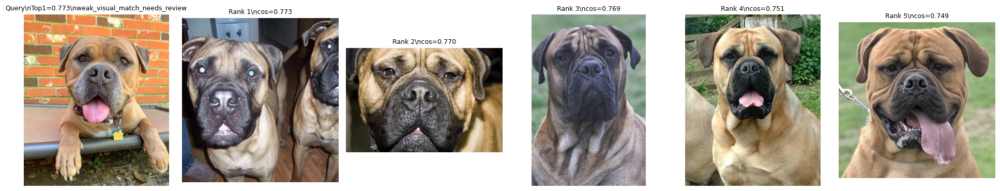

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step05b_optimized_query_15_1_neighbors.png


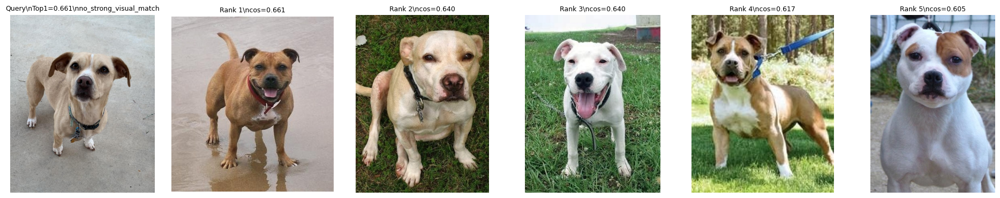

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step05b_optimized_query_1_1 (2)_neighbors.png


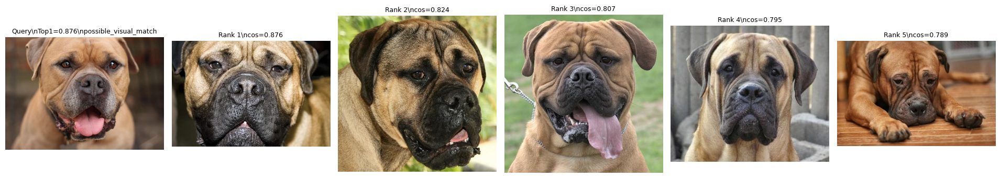

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step05b_optimized_query_2_1_neighbors.png


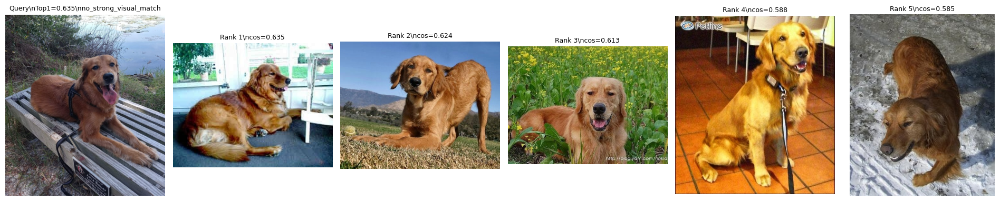

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step05b_optimized_query_8_1_neighbors.png


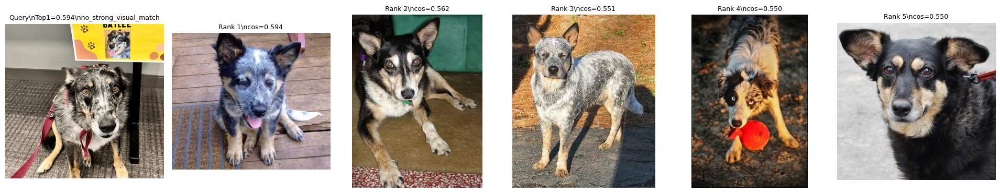

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step05b_optimized_query_n02093647_160_neighbors.png


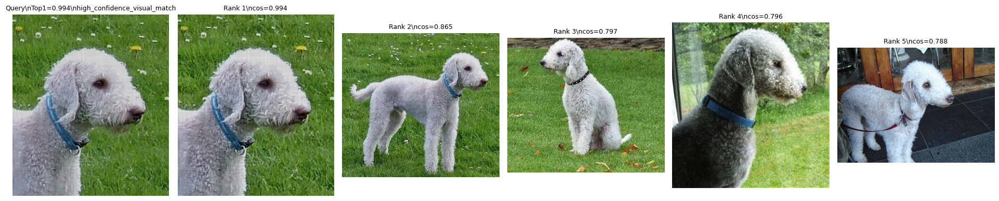

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step05b_optimized_query_n02096294_250_neighbors.png


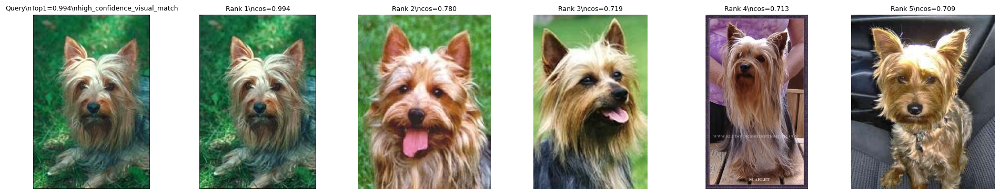

Figura guardada en: /content/drive/MyDrive/proyecto_integrador_v2/reports/figures/step05b_optimized_query_n02097474_393_neighbors.png


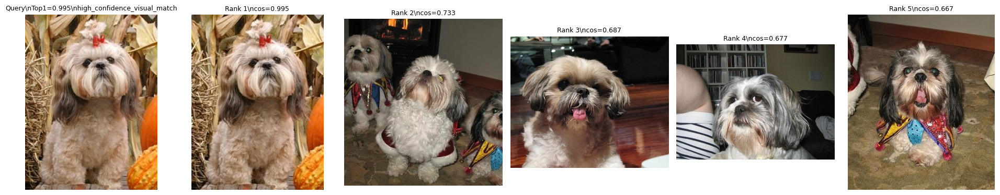

In [14]:
# 13. Visualización de resultados por query

def resolve_image_path(path_a, path_b=None):
    for p in [path_a, path_b]:
        if p is None or pd.isna(p):
            continue
        p = Path(str(p))
        if p.exists():
            return str(p)
    return None


def show_query_result(query_image_path, top_k=5, save=True):
    result_row = query_results_df[
        query_results_df["query_image_path"] == query_image_path
    ]

    if len(result_row) == 0:
        print("Query no encontrado:", query_image_path)
        return

    result_row = result_row.iloc[0]

    if result_row["status"] != "searched":
        print("Query no procesado para búsqueda:")
        display(result_row)
        return

    neighbors = (
        query_neighbors_df[
            (query_neighbors_df["query_image_path"] == query_image_path) &
            (query_neighbors_df["neighbor_rank"] <= top_k)
        ]
        .sort_values("neighbor_rank")
    )

    query_crop_path = result_row["query_crop_path"]

    image_paths = [query_crop_path]
    titles = [
        f"Query\\nTop1={result_row['top1_similarity']:.3f}\\n{result_row['final_decision']}"
    ]

    for _, row in neighbors.iterrows():
        neighbor_path = resolve_image_path(
            row.get("neighbor_original_crop_path", None),
            row.get("neighbor_crop_path", None)
        )
        image_paths.append(neighbor_path)
        titles.append(
            f"Rank {int(row['neighbor_rank'])}\\n"
            f"cos={row['cosine_similarity']:.3f}"
        )

    cols = len(image_paths)
    plt.figure(figsize=(3.2 * cols, 3.8))

    for i, img_path in enumerate(image_paths):
        plt.subplot(1, cols, i + 1)

        if img_path is None:
            plt.text(0.5, 0.5, "Imagen no encontrada", ha="center", va="center")
            plt.axis("off")
            continue

        try:
            img = Image.open(img_path).convert("RGB")
            plt.imshow(img)
            plt.title(titles[i], fontsize=9)
            plt.axis("off")
        except Exception as e:
            plt.text(0.5, 0.5, f"Error\\n{e}", ha="center", va="center")
            plt.axis("off")

    plt.tight_layout()

    if save:
        safe_name = Path(query_image_path).stem
        fig_path = FIGURES_PATH / f"step05b_optimized_query_{safe_name}_neighbors.png"
        plt.savefig(fig_path, dpi=150)
        print("Figura guardada en:", fig_path)

    plt.show()


if len(query_results_df) > 0:
    searched_queries = query_results_df[query_results_df["status"] == "searched"]["query_image_path"].tolist()

    for q in searched_queries:
        show_query_result(q, top_k=VISUAL_TOP_K, save=True)
else:
    print("No hay queries para visualizar.")

# Análisis de resultados del Paso 05

Este paso ejecuta una prueba end-to-end del sistema.  
A diferencia del Paso 04, aquí la imagen query no viene necesariamente de la base, sino de `team_test`.

La interpretación debe enfocarse en:

- si YOLO detectó correctamente al perro,
- si el crop es visualmente útil,
- si el embedding pudo generarse,
- qué tan altos son los vecinos Top-K,
- si los vecinos recuperados se parecen visualmente al query,
- si la decisión final es razonable.

En esta etapa, una coincidencia visual no debe interpretarse automáticamente como “es el mismo perro”.  
Eso se validará en el Paso 06 usando carpetas con varias imágenes del mismo perro.